# Imports

In [1]:
from astropy.io import fits
import numpy as np
import matplotlib.pyplot as plt
# glob serves some of the same functions as ls in the terminal
import glob
from astropy.nddata import CCDData
import ccdproc as ccdp

from astropy import units as u
from astropy.table import Table

from pathlib import Path
import os

from astropy.nddata import CCDData
from astropy.stats import mad_std


import warnings
warnings.filterwarnings("ignore")

## Convenience Functions

In [2]:
from astropy import visualization as aviz
from astropy.nddata.blocks import block_reduce
from astropy.nddata.utils import Cutout2D
from matplotlib import pyplot as plt


def show_image(image,
               percl=99, percu=None, is_mask=False,
               figsize=(10, 10),
               cmap='viridis', log=False, clip=True,
               show_colorbar=True, show_ticks=True,
               fig=None, ax=None, input_ratio=None):
    """
    Show an image in matplotlib with some basic astronomically-appropriat stretching.
    Parameters
    ----------
    image
        The image to show
    percl : number
        The percentile for the lower edge of the stretch (or both edges if ``percu`` is None)
    percu : number or None
        The percentile for the upper edge of the stretch (or None to use ``percl`` for both)
    figsize : 2-tuple
        The size of the matplotlib figure in inches
    """
    if percu is None:
        percu = percl
        percl = 100 - percl

    if (fig is None and ax is not None) or (fig is not None and ax is None):
        raise ValueError('Must provide both "fig" and "ax" '
                         'if you provide one of them')
    elif fig is None and ax is None:
        if figsize is not None:
            # Rescale the fig size to match the image dimensions, roughly
            image_aspect_ratio = image.shape[0] / image.shape[1]
            figsize = (max(figsize) * image_aspect_ratio, max(figsize))

        fig, ax = plt.subplots(1, 1, figsize=figsize)


    # To preserve details we should *really* downsample correctly and
    # not rely on matplotlib to do it correctly for us (it won't).

    # So, calculate the size of the figure in pixels, block_reduce to
    # roughly that,and display the block reduced image.

    # Thanks, https://stackoverflow.com/questions/29702424/how-to-get-matplotlib-figure-size
    fig_size_pix = fig.get_size_inches() * fig.dpi

    ratio = (image.shape // fig_size_pix).max()

    if ratio < 1:
        ratio = 1

    ratio = input_ratio or ratio

    reduced_data = block_reduce(image, ratio)

    if not is_mask:
        # Divide by the square of the ratio to keep the flux the same in the
        # reduced image. We do *not* want to do this for images which are
        # masks, since their values should be zero or one.
         reduced_data = reduced_data / ratio**2

    # Of course, now that we have downsampled, the axis limits are changed to
    # match the smaller image size. Setting the extent will do the trick to
    # change the axis display back to showing the actual extent of the image.
    extent = [0, image.shape[1], 0, image.shape[0]]

    if log:
        stretch = aviz.LogStretch()
    else:
        stretch = aviz.LinearStretch()

    norm = aviz.ImageNormalize(reduced_data,
                               interval=aviz.AsymmetricPercentileInterval(percl, percu),
                               stretch=stretch, clip=clip)

    if is_mask:
        # The image is a mask in which pixels should be zero or one.
        # block_reduce may have changed some of the values, so reset here.
        reduced_data = reduced_data > 0
        # Set the image scale limits appropriately.
        scale_args = dict(vmin=0, vmax=1)
    else:
        scale_args = dict(norm=norm)

    im = ax.imshow(reduced_data, origin='lower',
                   cmap=cmap, extent=extent, aspect='equal', **scale_args)

    if show_colorbar:
        # I haven't a clue why the fraction and pad arguments below work to make
        # the colorbar the same height as the image, but they do....unless the image
        # is wider than it is tall. Sticking with this for now anyway...
        # Thanks: https://stackoverflow.com/a/26720422/3486425
        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        # In case someone in the future wants to improve this:
        # https://joseph-long.com/writing/colorbars/
        # https://stackoverflow.com/a/33505522/3486425
        # https://matplotlib.org/mpl_toolkits/axes_grid/users/overview.html#colorbar-whose-height-or-width-in-sync-with-the-master-axes

    if not show_ticks:
        ax.tick_params(labelbottom=False, labelleft=False, labelright=False, labeltop=False)


def image_snippet(image, center, width=50, axis=None, fig=None,
                  is_mask=False, pad_black=False, **kwargs):
    """
    Display a subsection of an image about a center.
    Parameters
    ----------
    image : numpy array
        The full image from which a section is to be taken.
    center : list-like
        The location of the center of the cutout.
    width : int, optional
        Width of the cutout, in pixels.
    axis : matplotlib.Axes instance, optional
        Axis on which the image should be displayed.
    fig : matplotlib.Figure, optional
        Figure on which the image should be displayed.
    is_mask : bool, optional
        Set to ``True`` if the image is a mask, i.e. all values are
        either zero or one.
    pad_black : bool, optional
        If ``True``, pad edges of the image with zeros to fill out width
        if the slice is near the edge.
    """
    if pad_black:
        sub_image = Cutout2D(image, center, width, mode='partial', fill_value=0)
    else:
        # Return a smaller subimage if extent goes out side image
        sub_image = Cutout2D(image, center, width, mode='trim')
    show_image(sub_image.data, cmap='gray', ax=axis, fig=fig,
               show_colorbar=False, show_ticks=False, is_mask=is_mask,
               **kwargs)


def _mid(sl):
    return (sl.start + sl.stop) // 2


def display_cosmic_rays(cosmic_rays, images, titles=None,
                        only_display_rays=None):
    """
    Display cutouts of the region around each cosmic ray and the other images
    passed in.
    Parameters
    ----------
    cosmic_rays : photutils.segmentation.SegmentationImage
        The segmented cosmic ray image returned by ``photuils.detect_source``.
    images : list of images
        The list of images to be displayed. Each image becomes a column in
        the generated plot. The first image must be the cosmic ray mask.
    titles : list of str
        Titles to be put above the first row of images.
    only_display_rays : list of int, optional
        The number of the cosmic ray(s) to display. The default value,
        ``None``, means display them all. The number of the cosmic ray is
        its index in ``cosmic_rays``, which is also the number displayed
        on the mask.
    """
    # Check whether the first image is actually a mask.

    if not ((images[0] == 0) | (images[0] == 1)).all():
        raise ValueError('The first image must be a mask with '
                         'values of zero or one')

    if only_display_rays is None:
        n_rows = len(cosmic_rays.slices)
    else:
        n_rows = len(only_display_rays)

    n_columns = len(images)

    width = 12

    # The height below is *CRITICAL*. If the aspect ratio of the figure as
    # a whole does not allow for square plots then one ends up with a bunch
    # of whitespace. The plots here are square by design.
    height = width / n_columns * n_rows
    fig, axes = plt.subplots(n_rows, n_columns, sharex=False, sharey='row',
                             figsize=(width, height))

    # Generate empty titles if none were provided.
    if titles is None:
        titles = [''] * n_columns

    display_row = 0

    for row, s in enumerate(cosmic_rays.slices):
        if only_display_rays is not None:
            if row not in only_display_rays:
                # We are not supposed to display this one, so skip it.
                continue

        x = _mid(s[1])
        y = _mid(s[0])

        for column, plot_info in enumerate(zip(images, titles)):
            image = plot_info[0]
            title = plot_info[1]
            is_mask = column == 0
            ax = axes[display_row, column]
            image_snippet(image, (x, y), width=80, axis=ax, fig=fig,
                          is_mask=is_mask)
            if is_mask:
                ax.annotate('Cosmic ray {}'.format(row), (0.1, 0.9),
                            xycoords='axes fraction',
                            color='cyan', fontsize=20)

            if display_row == 0:
                # Only set the title if it isn't empty.
                if title:
                    ax.set_title(title)

        display_row = display_row + 1

    # This choice results in the images close to each other but with
    # a small gap.
    plt.subplots_adjust(wspace=0.1, hspace=0.05)

# Combining the Biases and the Darks and Flats

## Combining Biases

In [3]:
#This is how to add the units column so the example code doesn't flip. It is not efficient and should be done in a for loop but I freaked and just did it my own way
#bias = fits.open('./data/biases/Bias_BIN1_20230418_022847.fits')
#hdr = bias[0].header
#hdr['BUNIT'] = 'adu'
#bias.writeto('./data/biases/UNITS/Bias_BIN1_20230418_022847UNITS.fits')
#bias.close()

In [4]:
biasPath = Path('./data/biases/UNITS')
biases = ccdp.ImageFileCollection(biasPath)

In [65]:
calibratedBiases = biases.files_filtered(include_path=True)

combinedBiases = ccdp.combine(calibratedBiases,
                             method='median',
                             sigma_clip=True, sigma_clip_low_thresh=5, sigma_clip_high_thresh=5,
                             sigma_clip_func=np.ma.median, signma_clip_dev_func=mad_std,
                             mem_limit=350e6
                            )

combinedBiases.meta['combined'] = True

#combinedBiases.write(combinedCalibrationPath / 'combined_BiasesMedian.fit')

INFO:astropy:splitting each image into 25 chunks to limit memory usage to 350000000.0 bytes.


INFO: splitting each image into 25 chunks to limit memory usage to 350000000.0 bytes. [ccdproc.combiner]


[973.0, 975.0, 976.0, 976.0, 976.0, 976.0, 976.0, 976.0, 977.0, 976.0, 1118.0, 977.0, 1118.0, 976.2727272727273]


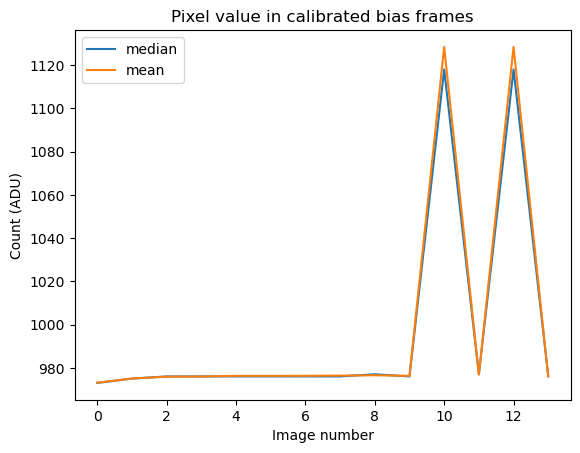

In [5]:
median_count = [np.median(data) for data in biases.data()]
mean_count = [np.mean(data) for data in biases.data()]
plt.plot(median_count, label='median')
plt.plot(mean_count, label='mean')
plt.xlabel('Image number')
plt.ylabel('Count (ADU)')
plt.title('Pixel value in calibrated bias frames')
plt.legend()
print(median_count)

## Combining Flats

In [6]:
hAlphaPath = Path('./data/flats/HalphaFlat/UNITS')
hAlphaFlats = ccdp.ImageFileCollection(hAlphaPath)

[19769.666666666668, 19097.0, 20079.0, 20119.0]


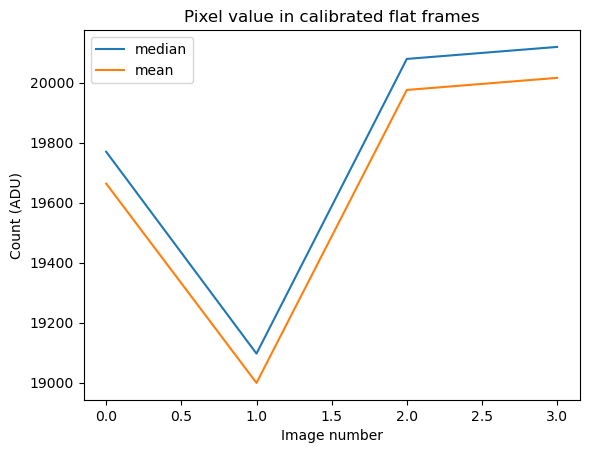

In [7]:
median_count = [np.median(data) for data in hAlphaFlats.data()]
mean_count = [np.mean(data) for data in hAlphaFlats.data()]
plt.plot(median_count, label='median')
plt.plot(mean_count, label='mean')
plt.xlabel('Image number')
plt.ylabel('Count (ADU)')
plt.title('Pixel value in calibrated flat frames')
plt.legend()
print(median_count)

In [69]:
calibratedFlats = hAlphaFlats.files_filtered(include_path=True)

combinedFlats = ccdp.combine(calibratedFlats,
                             method='median',
                             sigma_clip=True, sigma_clip_low_thresh=5, sigma_clip_high_thresh=5,
                             sigma_clip_func=np.ma.median, signma_clip_dev_func=mad_std,
                             mem_limit=350e6
                            )

combinedFlats.meta['combined'] = True
combinedFlats.write(combinedCalibrationPath / 'combinedAlphaFlatsMedian.fit')

INFO:astropy:splitting each image into 8 chunks to limit memory usage to 350000000.0 bytes.


INFO: splitting each image into 8 chunks to limit memory usage to 350000000.0 bytes. [ccdproc.combiner]


OSError: File data\CombinedCalibrations\combinedAlphaFlatsMedian.fit already exists. If you mean to replace it then use the argument "overwrite=True".

## Combining Darks

In [8]:
darkPath = Path('./data/darks/UNITS')
darks = ccdp.ImageFileCollection(darkPath)

In [21]:
calibratedDarks = darks.files_filtered(include_path=True)

combinedDarks = ccdp.combine(calibratedDarks,
                             method='average',
                             sigma_clip=True, sigma_clip_low_thresh=5, sigma_clip_high_thresh=5,
                            sigma_clip_func=np.ma.median, signma_clip_dev_func=mad_std,
                             mem_limit=350e6
                            )

combinedDarks.meta['combined'] = True

combinedDarks.write(darkPath / 'combined_DarksMedian.fit')

INFO:astropy:splitting each image into 8 chunks to limit memory usage to 350000000.0 bytes.


INFO: splitting each image into 8 chunks to limit memory usage to 350000000.0 bytes. [ccdproc.combiner]


# Reducing the Image

## Defining Nearest Dark Exposure

In [9]:
def find_nearest_dark_exposure(image, dark_exposure_times, tolerance=0.5):
    """
    Find the nearest exposure time of a dark frame to the exposure time of the image,
    raising an error if the difference in exposure time is more than tolerance.
    
    Parameters
    ----------
    
    image : astropy.nddata.CCDData
        Image for which a matching dark is needed.
    
    dark_exposure_times : list
        Exposure times for which there are darks.
    
    tolerance : float or ``None``, optional
        Maximum difference, in seconds, between the image and the closest dark. Set
        to ``None`` to skip the tolerance test.
    
    Returns
    -------
    
    float
        Closest dark exposure time to the image.
    """

    dark_exposures = np.array(list(dark_exposure_times))
    idx = np.argmin(np.abs(dark_exposures - image.header['exptime']))
    closest_dark_exposure = dark_exposures[idx]

    if (tolerance is not None and 
        np.abs(image.header['exptime'] - closest_dark_exposure) > tolerance):
        
        raise RuntimeError('Closest dark exposure time is {} for flat of exposure '
                           'time {}.'.format(closest_dark_exposure, a_flat.header['exptime']))
        
    
    return closest_dark_exposure

## Applying Flats, Bias, and Darks

In [10]:
sciencePath = Path('./data/scienceImage/UNITS')
scienceImage = ccdp.ImageFileCollection(sciencePath)
#scienceImage.summary

In [11]:
combinedCalibrationPath = Path('./data/CombinedCalibrations')
calibrationImages = ccdp.ImageFileCollection(combinedCalibrationPath)
calibrationImages.summary

file,simple,bitpix,naxis,naxis1,naxis2,extend,date-obs,exptime,exposure,set-temp,ccd-temp,xpixsz,ypixsz,xbinning,ybinning,xorgsubf,yorgsubf,readoutm,filter,imagetyp,focallen,aptdia,aptarea,swcreate,swserial,focuspos,focusssz,focustem,objctra,objctdec,objctalt,objctaz,objctha,sitelat,sitelong,jd,jd-helio,airmass,object,telescop,instrume,observer,notes,roworder,flipstat,swowner,date,time-obs,ut,timesys,radecsys,ra,dec,bunit,combined,history,cstretch,cblack,cwhite,pedestal,egain,sbstdver
str28,bool,int32,int32,int32,int32,bool,str23,float64,float64,float64,float64,float64,float64,int32,int32,int32,int32,object,object,str10,float64,float64,float64,str34,str32,int32,float64,float64,str11,str11,object,object,str8,object,object,float64,float64,object,str1,str12,str17,str1,str1,str8,str6,str17,object,object,object,object,object,object,object,str3,bool,object,object,object,object,object,object,object
combinedAlphaFlats.fit,True,-64,2,3056,3056,True,2023-04-19T02:51:24.230,624.37,624.37,-25.0,-25.0,12.0,12.0,1,1,0,0,8 MHz,Halpha,FLAT,4064.0,508.0,195211.29477845234,MaxIm DL Version 6.30 220131 281PM,281PM-8A6WH-VE178-0FAUA-86E4Q-U8,6064,6.201171874993303,0.0,05 23 29.00,+31 47 02.0,37.3573,287.2786,4.2176,32 46 49,-105 49 13,2460053.6190304398,2460053.619246404,1.62849525169,,ARCSAT 0.5-m,BYUcam,,,TOP-DOWN,Mirror,William Ketzeback,19/04/23,02:51:24,02:51:24,UTC,FK5,05 23 29.00,+31 47 02.0,adu,True,File was processed by PinPoint 7.0.0 at 2023-04-19T03:02:18,--,--,--,--,--,--
combinedAlphaFlatsMedian.fit,True,-64,2,3056,3056,True,2023-04-19T02:51:24.230,624.37,624.37,-25.0,-25.0,12.0,12.0,1,1,0,0,8 MHz,Halpha,FLAT,4064.0,508.0,195211.29477845234,MaxIm DL Version 6.30 220131 281PM,281PM-8A6WH-VE178-0FAUA-86E4Q-U8,6064,6.201171874993303,0.0,05 23 29.00,+31 47 02.0,37.3573,287.2786,4.2176,32 46 49,-105 49 13,2460053.6190304398,2460053.619246404,1.62849525169,,ARCSAT 0.5-m,BYUcam,,,TOP-DOWN,Mirror,William Ketzeback,19/04/23,02:51:24,02:51:24,UTC,FK5,05 23 29.00,+31 47 02.0,adu,True,File was processed by PinPoint 7.0.0 at 2023-04-19T03:02:18,--,--,--,--,--,--
combined_Biases.fit,True,-64,2,3056,3056,True,2023-04-18T02:21:34.04,0.0,0.0,-25.0,-25.0,12.0,12.0,1,1,0,0,8 MHz,--,BIAS,4064.0,508.0,195211.29477845234,MaxIm DL Version 6.30 220131 281PM,281PM-8A6WH-VE178-0FAUA-86E4Q-U8,6043,6.201171874993303,0.0,09 34 46,+46 20 34,75.0477,23.3684,-0.5673,32 46 49,-105 49 13,2460052.598310648,2460052.5993981836,1.0349892362243172,,ARCSAT 0.5-m,BYUcam,,,TOP-DOWN,Mirror,William Ketzeback,--,--,--,--,--,--,--,adu,True,--,Medium,972,992,0,--,--
combined_BiasesMedian.fit,True,-64,2,3056,3056,True,2023-04-18T02:21:34.04,0.0,0.0,-25.0,-25.0,12.0,12.0,1,1,0,0,8 MHz,--,BIAS,4064.0,508.0,195211.29477845234,MaxIm DL Version 6.30 220131 281PM,281PM-8A6WH-VE178-0FAUA-86E4Q-U8,6043,6.201171874993303,0.0,09 34 46,+46 20 34,75.0477,23.3684,-0.5673,32 46 49,-105 49 13,2460052.598310648,2460052.5993981836,1.0349892362243172,,ARCSAT 0.5-m,BYUcam,,,TOP-DOWN,Mirror,William Ketzeback,--,--,--,--,--,--,--,adu,True,--,Medium,972,992,0,--,--
combined_DarksMedian.fit,True,-64,2,3056,3056,True,2023-05-02T03:24:50.31,1800.0,1800.0,-25.0,-25.0,12.0,12.0,1,1,0,0,--,--,Dark Frame,0.0,0.0,0.0,MaxIm DL Version 6.30 220131 281PM,281PM-8A6WH-VE178-0FAUA-86E4Q-U8,6232,6.201171874993303,0.0,07 19 41,+31 51 02,--,--,-7.3531,--,--,2460066.6422489583,2460066.6503213444,--,,ARCSAT 0.5-m,flipro0:PL0480308,,,TOP-DOWN,Mirror,William Ketzeback,--,--,--,--,--,--,--,adu,True,--,Medium,939,1860,0,1.5,SBFITSEXT Version 1.0


In [12]:
combinedDarks = [ccd for ccd in calibrationImages.ccds(combined=True)][4]
combinedBiases = [ccd for ccd in calibrationImages.ccds(combined = True)][3]
combinedFlats = [ccd for ccd in calibrationImages.ccds(combined=True)][1]

In [13]:
ccdScience = [ccd for ccd in scienceImage.ccds(imagetyp = 'LIGHT')][0]
reduced = ccdp.subtract_bias(ccdScience, combinedBiases)
combinedDarks = ccdp.subtract_bias(combinedDarks, combinedBiases)
combinedFlats = ccdp.subtract_bias(combinedFlats, combinedBiases)

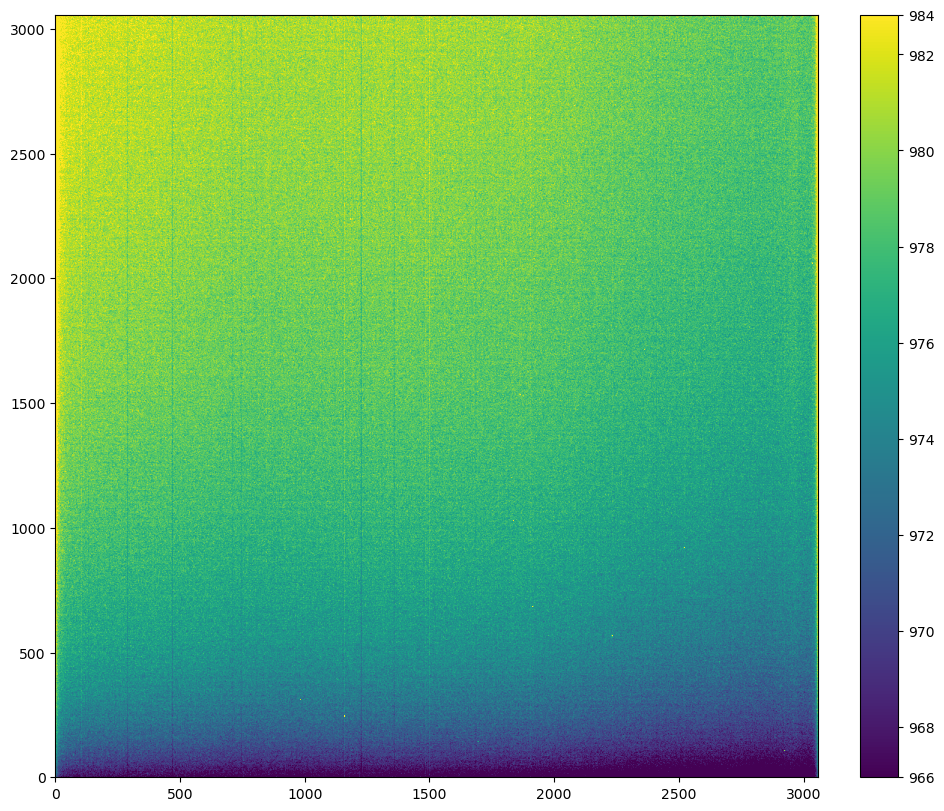

In [17]:
fig, axs = plt.subplots(
    figsize = (11, 8),
    constrained_layout = True
)
show_image(combinedBiases, ax = axs, fig = fig)

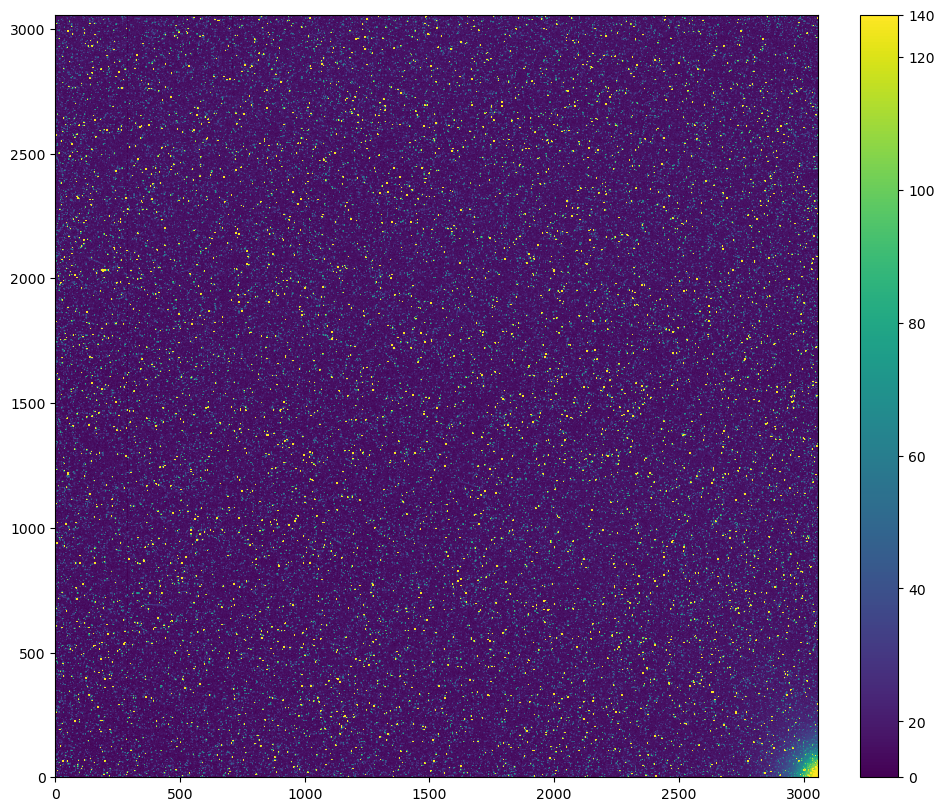

In [9]:
fig, axs = plt.subplots(
    figsize = (11, 8),
    constrained_layout = True
)
show_image(combinedDarks, ax = axs, fig = fig)

In [10]:
combinedFlats = ccdp.subtract_dark(combinedFlats, combinedDarks, exposure_time = 'exptime', exposure_unit = u.second, scale = True)
reduced = ccdp.subtract_dark(reduced, combinedDarks, exposure_time='exptime',exposure_unit = u.second)

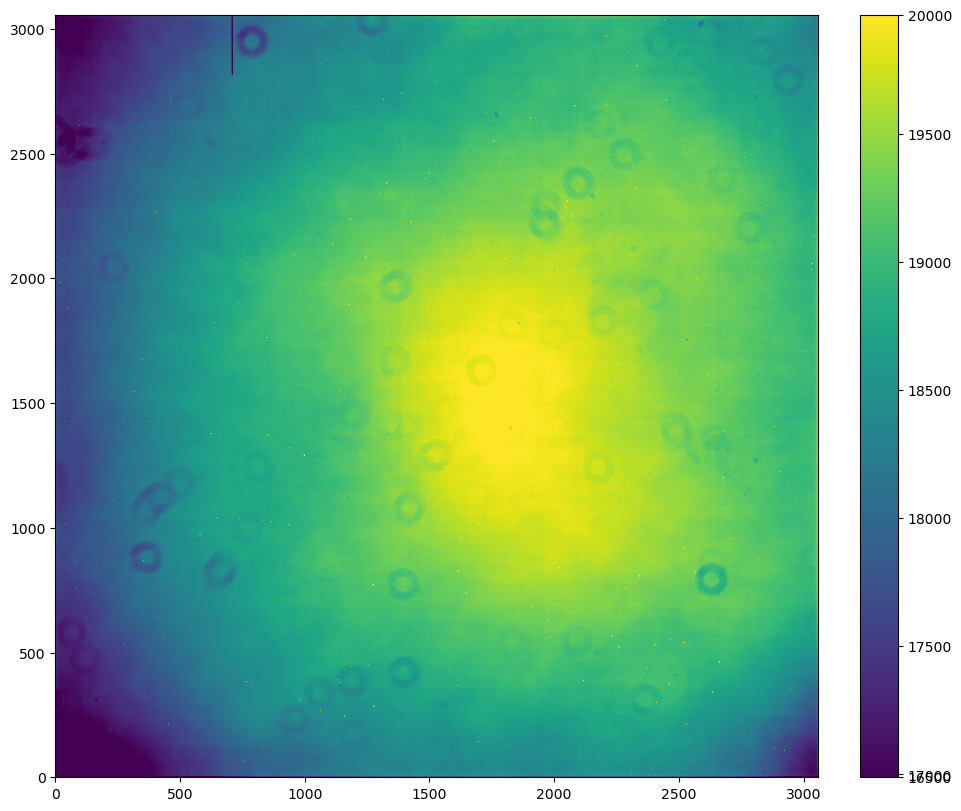

In [11]:
fig, axs = plt.subplots(
    figsize = (11, 8),
    constrained_layout = True
)
show_image(combinedFlats, ax = axs, fig = fig)

In [19]:
reduced = ccdp.flat_correct(reduced, combinedFlats)

## THE IMAGE

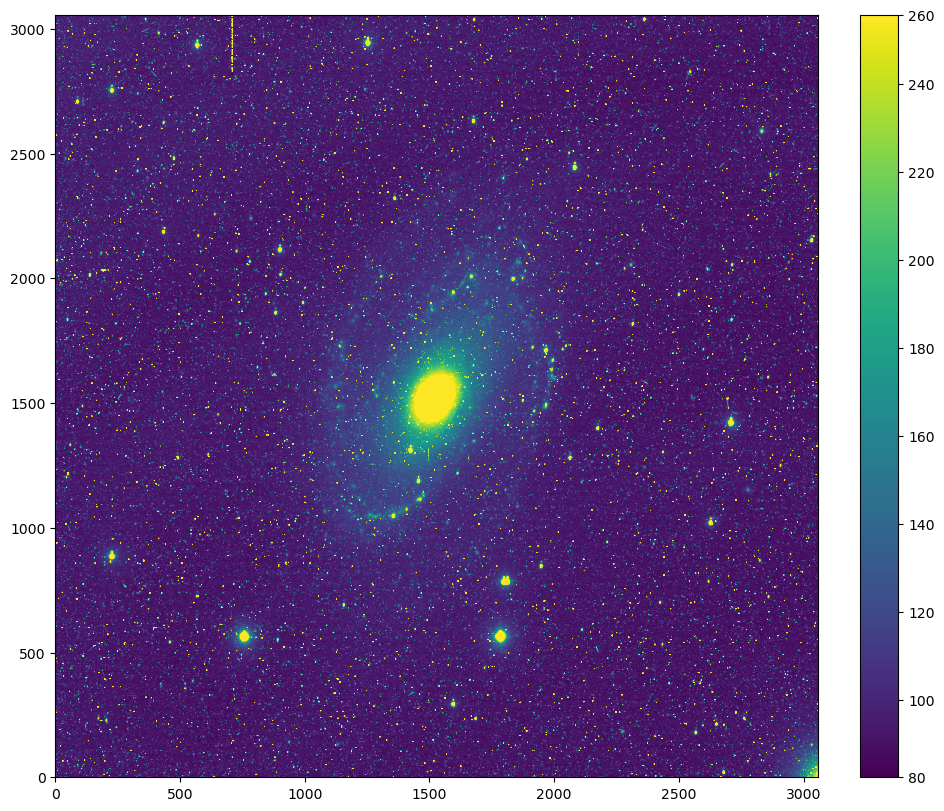

In [20]:
fig, axs = plt.subplots(
    figsize = (11, 8),
    constrained_layout = True
)
show_image(reduced, ax = axs, fig = fig)
#reducedPath = Path('./data/reducedImages')
#reduced.write(reducedPath / 'm81Reduced.fit')

# Using DAOStarFinder

## Aperture Photometry

In [21]:
from photutils.detection import DAOStarFinder
from photutils.aperture import CircularAperture, EllipticalAperture, EllipticalAnnulus
from photutils.aperture import aperture_photometry

from astropy.io import fits

In [22]:
m81 = np.asarray(reduced)
m81

array([[ 55.19197657, 105.18095705, 108.73065976, ..., 319.45430827,
        326.75401647, 317.26121739],
       [ 88.23398075,  85.72422654,  86.992458  , ..., 309.7741633 ,
        292.14597545, 736.48179836],
       [106.54273864,  85.35572619,  91.29687426, ..., 278.48202095,
        278.89964835, 297.26988047],
       ...,
       [102.23671807,  92.40733322,  98.77789529, ..., 113.60312122,
        692.28941887,  80.0262017 ],
       [228.3981634 ,  82.13192713,  95.6087213 , ...,  91.53380162,
         90.80800383, 552.69878734],
       [ 70.85301121,  84.08732702, 105.92831727, ...,  97.76363265,
         77.63900735,  74.7502422 ]])

In [23]:
bkgSigma = mad_std(m81)
daoFind = DAOStarFinder(fwhm = 3.0, threshold = 10.0 * bkgSigma)
mask = np.ones(m81.shape, dtype=bool)
mask[0:500, 0:500] = False
source= daoFind(m81, mask=mask)
source

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64
1,260.55898170386786,5.982735954634633,0.9894298474498239,-0.197765942270391,-0.34979335276106077,25,0.0,1173.8409025990584,5.592455871468247,-1.8690064147095777
2,102.62422887313905,21.447508529219913,0.38173650268729814,0.09195390029611722,0.21747542758161184,25,0.0,354.90482092766473,2.2502662216622213,-0.8805847527888132
3,250.82803159301955,42.17159079928529,0.699363153021675,0.8020285294911738,0.2952337634655893,25,0.0,525.2101533244354,2.688909168490772,-1.0739403299451036
4,489.81645951159595,44.58539490373827,0.4391621732190801,0.14011825905932332,0.49446128560709235,25,0.0,435.067886752271,2.7654571173460343,-1.1044173211384531
5,488.361941965634,53.01382393871759,0.3479155138996352,0.017015040927212205,0.003859089096817356,25,0.0,358.94839531580084,2.3580862328302588,-0.9313992068993399
6,259.07167190905824,58.29574634227349,0.67835974128766,-0.12097909774108219,-0.017047087216892506,25,0.0,372.67570315138687,1.7427636664655897,-0.6030962427192114
7,257.34420365424774,62.015750932732544,0.9159350747436292,0.23960558097228407,-0.13175581277078544,25,0.0,515.7402777277856,2.243011335431973,-0.8770786709203222
8,409.9181238349034,70.96159818196676,0.9421115296804687,0.20377902492131833,0.22657051909394862,25,0.0,399.6567908756821,1.5463463172996226,-0.4732669109688128
9,238.97473223407428,83.71848210946796,0.776644492452564,-0.48417165063254325,-0.5056216187573528,25,0.0,460.82827801750716,2.0715936276214015,-0.790761416063137


In [24]:
positions = np.transpose((source['xcentroid'], source['ycentroid']))  
apertures = CircularAperture(positions, r=4.0)  
phot_table = aperture_photometry(reduced, apertures)  
for col in phot_table.colnames:  
    phot_table[col].info.format = '%.8g'  # for consistent table output
print(phot_table)  

 id  xcenter   ycenter  aperture_sum aperture_sum_err
       pix       pix        adu            adu       
--- --------- --------- ------------ ----------------
  1 260.55898  5.982736    6596.3246        26.015348
  2 102.62423 21.447509    6326.2062        24.363649
  3 250.82803 42.171591    6485.2789        24.598223
  4 489.81646 44.585395    6540.7155        23.635372
  5 488.36194 53.013824    6556.8659        22.536877
  6 259.07167 58.295746    8422.7391        29.748337
  7  257.3442 62.015751    8224.1328        29.348109
  8 409.91812 70.961598    5577.3155        23.234775
  9 238.97473 83.718482    6665.1818        24.893781
 10 194.38899 86.061502    9651.4154        27.943828
...       ...       ...          ...              ...
 49 464.69144 434.03296    5258.4374        20.662511
 50 27.624525 435.19637    9897.9877        28.557619
 51 231.98215 443.53749    5585.6767        23.136058
 52 467.93425 443.48438    7315.7398        24.277832
 53 138.04774 445.66704     

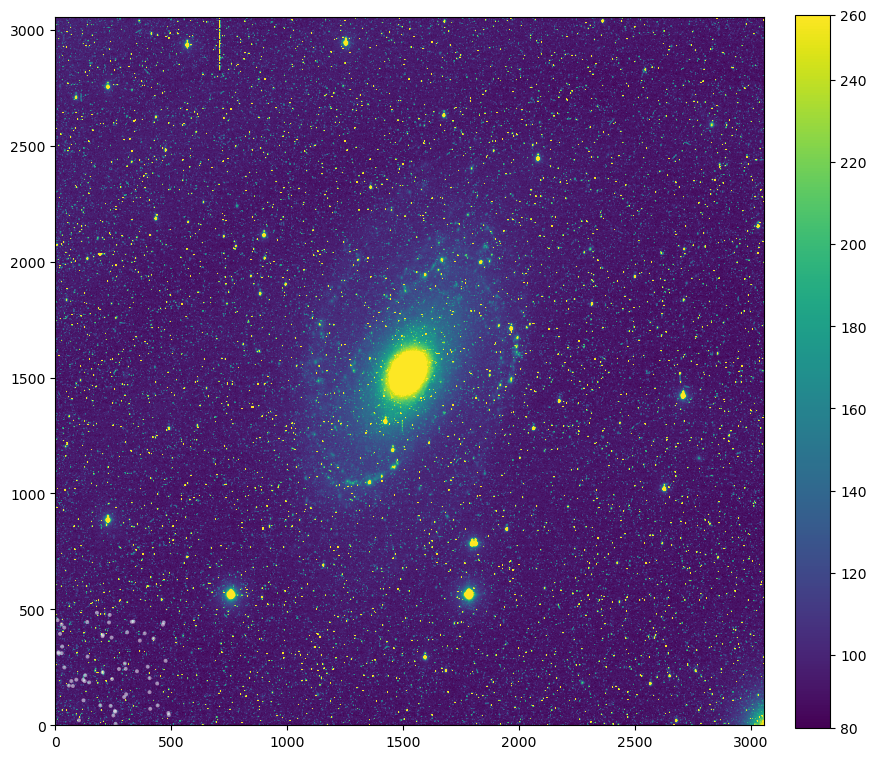

In [25]:
show_image(m81)
apertures.plot(color='w', lw=1.5, alpha=0.5);

## Circular Annulus

In [26]:
from photutils.aperture import CircularAnnulus

In [27]:
annulusInner = 4
annulusOuter = 8

annulusApert = CircularAnnulus(positions, r_in = annulusInner, r_out = annulusOuter)
annulusPhotometry = aperture_photometry(reduced, annulusApert)

annulusArea = np.pi * ((annulusOuter ** 2) - (annulusInner ** 2))
apertureArea = np.pi * (4**2) #The 4 comes from the previous part where I used 4 for the aperture radius
countPerArea = annulusPhotometry['aperture_sum'] / annulusArea
background = countPerArea * apertureArea
print(annulusPhotometry)
counts = annulusPhotometry['aperture_sum'] - background
print(counts)

 id      xcenter            ycenter          aperture_sum     aperture_sum_err 
           pix                pix                adu                adu        
--- ------------------ ------------------ ------------------ ------------------
  1 102.63691545697665  21.41711892248925 11296.076152344376  76.92182269332848
  2 250.82394942264648 42.141029012707605   9899.04820055977  315.8917711577776
  3  489.8061871231058 44.583504740973325 11721.593879633641  74.64452920298612
  4  487.8771519153982  53.04314607874073 11769.301286675274  71.40857686670998
  5  259.0717185475636  58.29069158445506 11963.591229352758 108.24131379221703
  6 257.37274012741204 62.029687232276004 12351.354157374335  77.85181068252712
  7  409.8872077234682  70.89229907013588 11281.827879358461  93.67967162900663
  8  238.9721373557595   83.7319586395999 12089.712315991601  77.08431672268269
  9 194.39347046203775  86.04872269642928  10174.59245493624  490.8609291867032
 10  441.9532953526807  85.6501859450180

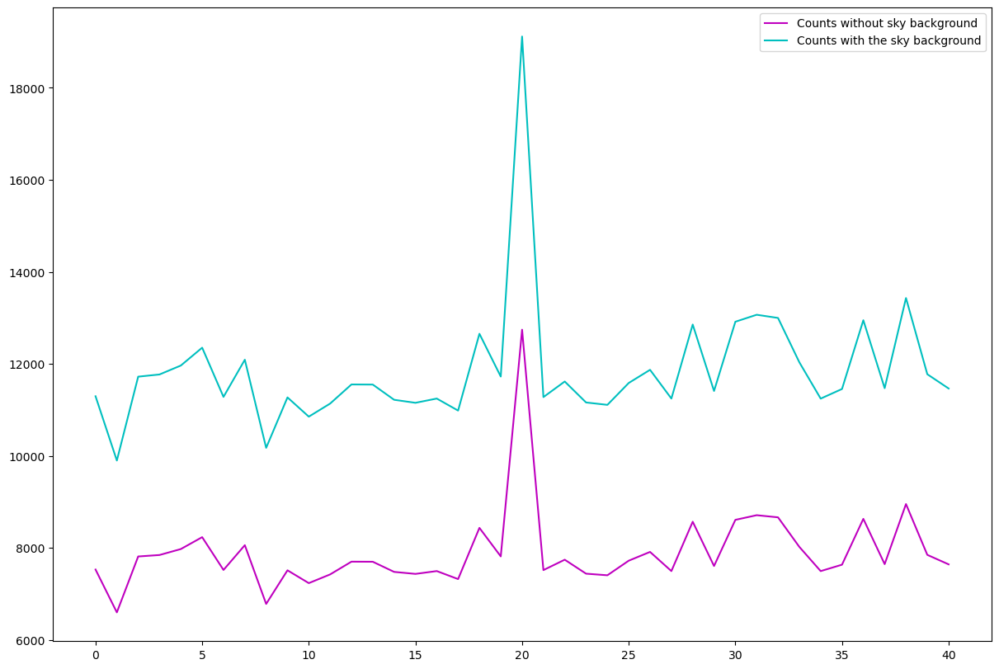

In [28]:
fig, ax = plt.subplots(
    figsize = (12, 8),
    constrained_layout = True
)
x = np.arange(0, len(annulusPhotometry['aperture_sum']), 1)
ax.plot(x, counts, color = 'm', label='Counts without sky background')
ax.plot(x, annulusPhotometry['aperture_sum'], color = 'c', label = 'Counts with the sky background')
ax.legend();

## Point Source Function

In [29]:
from photutils.background import MADStdBackgroundRMS, MMMBackground
from photutils.detection import IRAFStarFinder
from photutils.psf import DAOGroup, IntegratedGaussianPRF, BasicPSFPhotometry

from astropy.modeling.fitting import LevMarLSQFitter
from astropy.stats import gaussian_sigma_to_fwhm

In [30]:
sigmaPSF = 2.0
backgroundRMS = MADStdBackgroundRMS()
std = backgroundRMS(reduced)
irad = IRAFStarFinder(threshold = 3.5 * std,
                      fwhm = sigmaPSF * gaussian_sigma_to_fwhm,
                      minsep_fwhm = 0.01, roundhi = 5.0, roundlo = -5.0,
                      sharplo = 0.0, sharphi = 2.0)
daoGroup = DAOGroup (2.0 * sigmaPSF * gaussian_sigma_to_fwhm)
mmmBackground = MMMBackground()
levMarFitter = LevMarLSQFitter()

psfModel = IntegratedGaussianPRF(sigma = sigmaPSF)
psfModel.x_0.fixed = True
psfModel.y_0.fixed = True

pos = Table(names=['x_0', 'y_0'], data = [source['xcentroid'], source['ycentroid']])
photometry = BasicPSFPhotometry(group_maker = daoGroup,
                                bkg_estimator = mmmBackground,
                                psf_model = psfModel, 
                                fitter = LevMarLSQFitter(),
                                fitshape = (11,11))
psfPhot = photometry(image = m81, init_guesses = pos)
residual_image = photometry.get_residual_image()

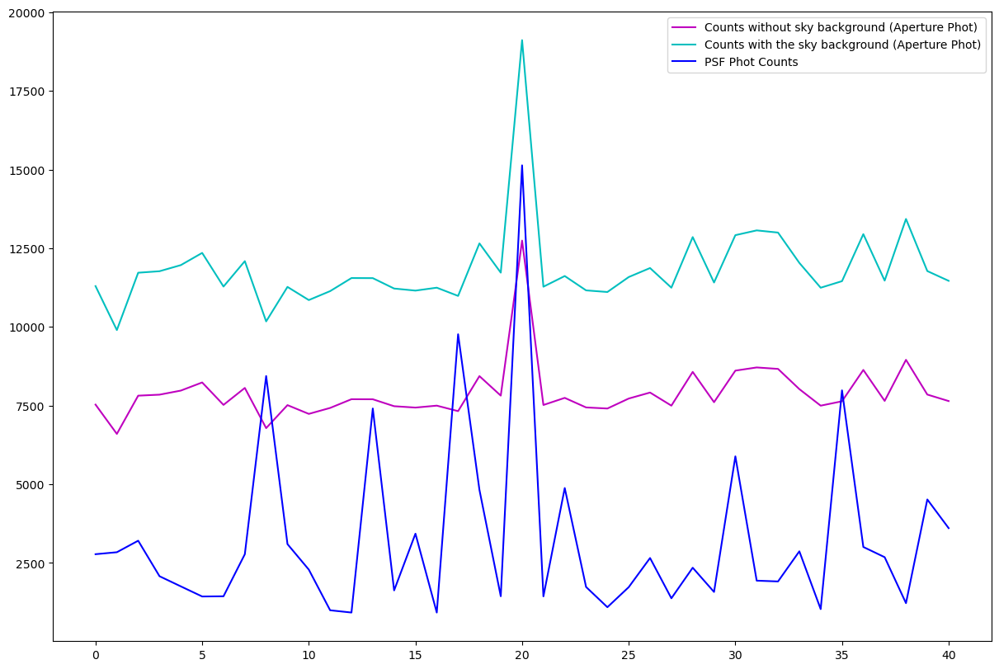

In [31]:
fig, ax = plt.subplots(
    figsize = (12,8),
    constrained_layout = True
)

x = np.arange(0, len(annulusPhotometry['aperture_sum']), 1)
ax.plot(x, counts, color = 'm', label='Counts without sky background (Aperture Phot)')
ax.plot(x, annulusPhotometry['aperture_sum'], color = 'c', label = 'Counts with the sky background (Aperture Phot)')
ax.plot(x, psfPhot['flux_fit'], label = 'PSF Phot Counts', color = 'b')
ax.legend();

# Try with M82

In [12]:
m82LightPath = Path('./m82Data/light')
m82Images = ccdp.ImageFileCollection(m82LightPath)

In [13]:
m82CalibrationPath = Path('./data/CombinedCalibrations/m82')

## Combining the flats

In [14]:
m82FlatPath = Path('./m82Data/flats/UNITS')
m82Flats = ccdp.ImageFileCollection(m82FlatPath)
#m82Flats.summary

In [22]:
calibratedFlats = m82Flats.files_filtered(include_path=True)

combinedFlats = ccdp.combine(calibratedFlats,
                             method='average',
                             sigma_clip=True, sigma_clip_low_thresh=5, sigma_clip_high_thresh=5,
                             sigma_clip_func=np.ma.median, signma_clip_dev_func=mad_std,
                             mem_limit=350e6
                            )

combinedFlats.meta['combined'] = True

combinedFlats.write(m82CalibrationPath / 'combinedFlatsM82.fit')

INFO:astropy:splitting each image into 5 chunks to limit memory usage to 350000000.0 bytes.


INFO: splitting each image into 5 chunks to limit memory usage to 350000000.0 bytes. [ccdproc.combiner]


## Reducing the data

In [15]:
combinedCalibrationPath = Path('./data/CombinedCalibrations')
combinedFlatsM82 = ccdp.ImageFileCollection(m82CalibrationPath)
calibrationImages = ccdp.ImageFileCollection(combinedCalibrationPath)
combinedFlatsM82.summary

file,simple,bitpix,naxis,naxis1,naxis2,extend,date-obs,exptime,exposure,set-temp,ccd-temp,xpixsz,ypixsz,xbinning,ybinning,xorgsubf,yorgsubf,filter,imagetyp,focallen,aptdia,aptarea,egain,sbstdver,swcreate,swserial,focuspos,focusssz,focustem,objctra,objctdec,objctha,jd,jd-helio,object,telescop,instrume,observer,notes,roworder,flipstat,swowner,date,time-obs,ut,timesys,radecsys,ra,dec,bunit,combined,history
str20,bool,int32,int32,int32,int32,bool,str23,float64,float64,float64,float64,float64,float64,int32,int32,int32,int32,str6,str4,float64,float64,float64,float64,str21,str34,str32,int32,float64,float64,str11,str11,str8,float64,float64,str1,str12,str17,str1,str1,str8,str6,str17,str8,str8,str8,str3,str3,str11,str11,str3,bool,str59
combinedFlatsM82.fit,True,-64,2,3056,3056,True,2023-05-02T02:50:08.179,49.25,49.25,-25.0,-25.0,12.0,12.0,1,1,0,0,sdss_g,FLAT,0.0,0.0,0.0,1.5,SBFITSEXT Version 1.0,MaxIm DL Version 6.30 220131 281PM,281PM-8A6WH-VE178-0FAUA-86E4Q-U8,6251,6.201171874993303,0.0,06 15 32.00,+31 48 48.0,-6.2842,2460066.6181502314,2460066.6149059045,,ARCSAT 0.5-m,flipro0:PL0480308,,,TOP-DOWN,Mirror,William Ketzeback,02/05/23,02:50:08,02:50:08,UTC,FK5,06 15 32.00,+31 48 48.0,adu,True,File was processed by PinPoint 7.0.0 at 2023-05-02T02:51:24


In [16]:
combinedDarks = [ccd for ccd in calibrationImages.ccds(combined=True)][4]
combinedBiases = [ccd for ccd in calibrationImages.ccds(combined = True)][3]
combinedFlats = [ccd for ccd in combinedFlatsM82.ccds(combined=True)][0]

In [17]:
path = Path('./m82Data/light/UNITS')
scienceImage = ccdp.ImageFileCollection(path)
scienceImage.summary

file,simple,bitpix,naxis,naxis1,naxis2,bscale,bzero,date-obs,exptime,exposure,set-temp,ccd-temp,xpixsz,ypixsz,xbinning,ybinning,xorgsubf,yorgsubf,readoutm,filter,imagetyp,traktime,focallen,aptdia,aptarea,swcreate,swserial,focuspos,focusssz,focustem,objctra,objctdec,objctalt,objctaz,objctha,sitelat,sitelong,jd,jd-helio,airmass,object,telescop,instrume,observer,notes,roworder,flipstat,cstretch,cblack,cwhite,pedestal,swowner,jd-obs,hjd-obs,bjd-obs,azimuth,altitude,ha,readmode,ambtemp,humidity,dewpoint,windspd,skytemp,date,time-obs,ut,timesys,radecsys,st,lat-obs,long-obs,alt-obs,observat,ra,dec,bunit,history
str31,bool,int32,int32,int32,int32,int32,int32,str23,float64,float64,float64,float64,float64,float64,int32,int32,int32,int32,str5,str6,str5,float64,float64,float64,float64,str34,str32,int32,float64,float64,str11,str11,float64,float64,str11,str8,str10,float64,float64,float64,str3,str12,str6,str4,str1,str8,str6,str6,int32,int32,int32,str17,float64,float64,float64,float64,float64,str11,str5,int32,int32,int32,int32,int32,str8,str8,str8,str3,str3,str11,float64,float64,float64,str6,str11,str11,str3,str59
M82_Halpha_20230419_050034.fits,True,16,2,3056,3056,1,32768,2023-04-19T05:01:54.210,1800.0,1800.0,-25.0,-25.0,12.0,12.0,1,1,0,0,8 MHz,Halpha,LIGHT,5.0,4064.0,508.0,195211.29477845234,MaxIm DL Version 6.30 220131 281PM,281PM-8A6WH-VE178-0FAUA-86E4Q-U8,6064,6.201171874993303,0.0,09 55 52.73,+69 40 45.8,50.0096,345.4356,01 50 56.11,32 46 49,-105 49 13,2460053.7096552085,2460053.7166668195,1.33493480116,M82,ARCSAT 0.5-m,BYUcam,AS05,,TOP-DOWN,Mirror,Medium,1061,1965,0,William Ketzeback,2460053.7096552,2460053.7096806,2460053.7105307,345.4356,50.0096,01 50 56.11,8 MHz,-18,-1,-73,21,-18,19/04/23,05:01:54,05:01:54,UTC,FK5,11 46 48.84,32.7802777778,-105.820277778,2788.0,ARCSAT,09 55 52.73,+69 40 45.8,adu,File was processed by PinPoint 7.0.0 at 2023-04-19T05:32:22


## Subtracting Darks, Biases, and Flat Combining

In [18]:
ccdScience = [ccd for ccd in scienceImage.ccds(imagetyp = 'LIGHT', )][0]
reducedm82 = ccdp.subtract_bias(ccdScience, combinedBiases)
combinedDarks = ccdp.subtract_bias(combinedDarks, combinedBiases)
combinedFlats = ccdp.subtract_bias(combinedFlats, combinedBiases)

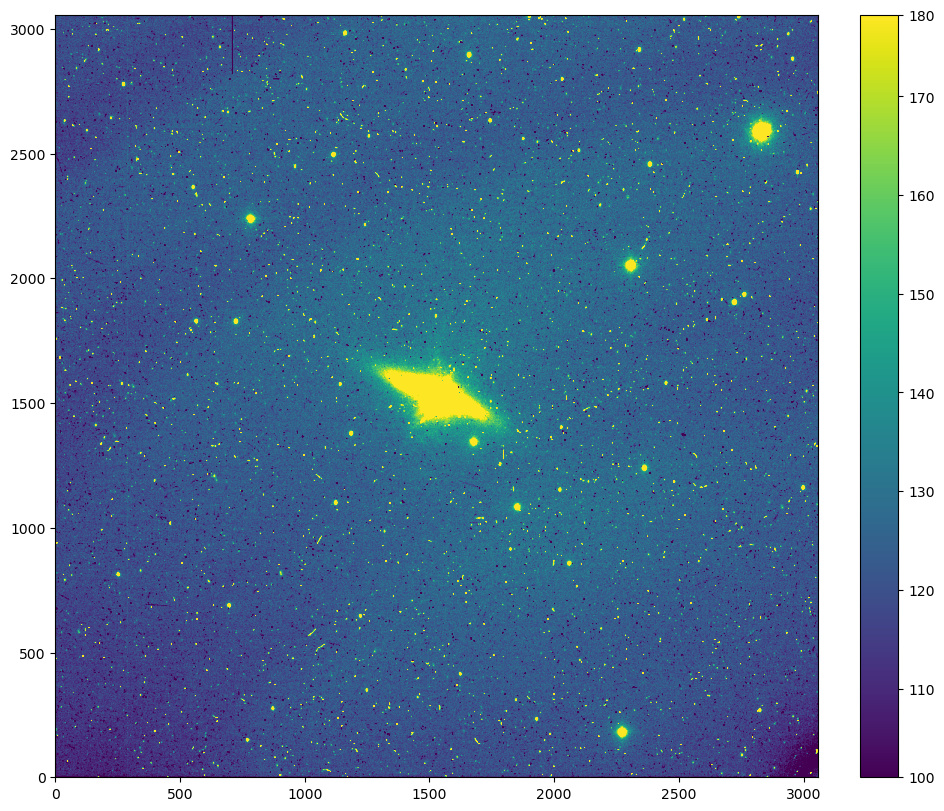

In [19]:
combinedFlats = ccdp.subtract_dark(combinedFlats, combinedDarks, exposure_time = 'exptime', exposure_unit = u.second, scale = True)
reducedm82 = ccdp.subtract_dark(reducedm82, combinedDarks, exposure_time='exptime',exposure_unit = u.second)
fig, axs = plt.subplots(
    figsize = (11, 8),
    constrained_layout = True
)

show_image(reducedm82, ax = axs, fig = fig)

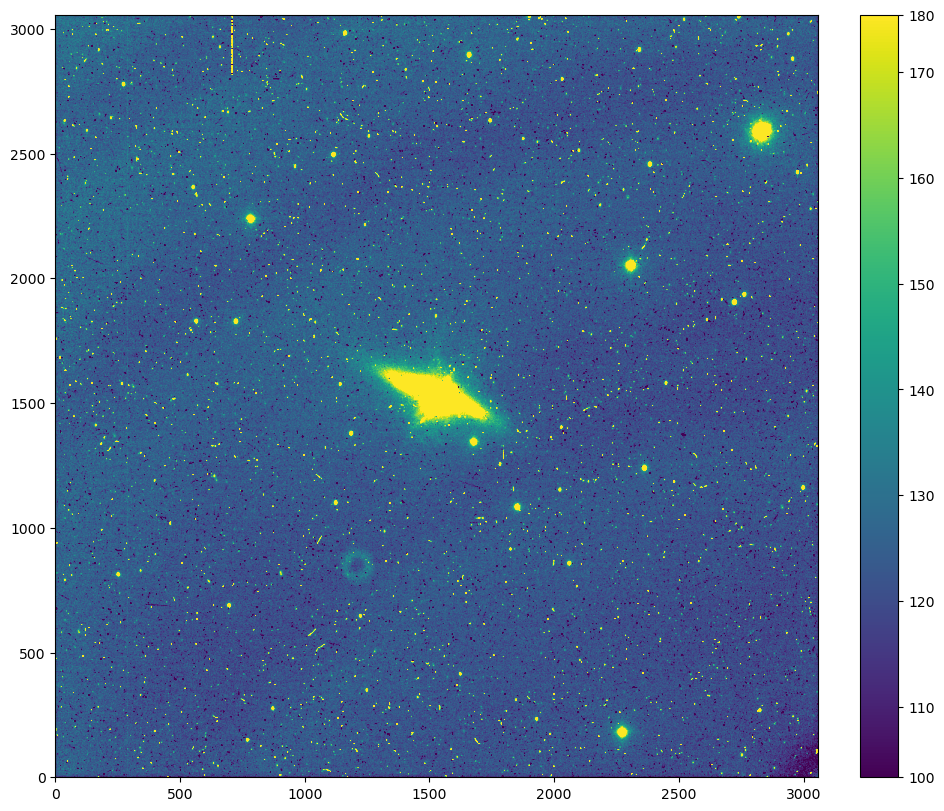

In [20]:
reducedm82 = ccdp.flat_correct(reducedm82, combinedFlats)
fig, axs = plt.subplots(
    figsize = (11, 8),
    constrained_layout = True
)

show_image(reducedm82, ax = axs, fig = fig)

# Finding SFR

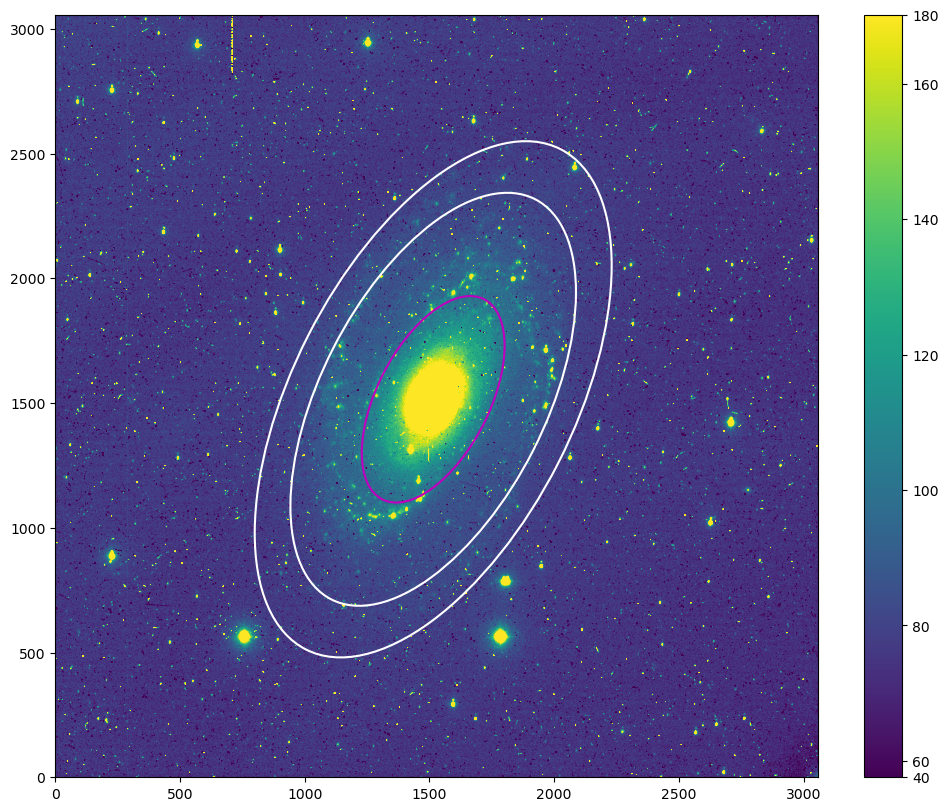

In [75]:
position = (1515,1515)
semiMajor = 450
semiMinor = 225
theta = 1.1
annulusInner = 2
annulusOuter = 2.5

ellipticalMask = EllipticalAperture(position, semiMajor, semiMinor, theta)
ellipticalAnnulus = EllipticalAnnulus(position, a_in = semiMajor * annulusInner, a_out = semiMajor * annulusOuter,
                                      b_in = semiMinor * annulusInner, b_out = semiMinor * annulusOuter, theta = theta)

fig, ax = plt.subplots(
    figsize = (12,8),
    constrained_layout = True
)
show_image(reduced, ax = ax, fig = fig)
ellipticalMask.plot(color = 'm', lw = 1.5)
ellipticalAnnulus.plot(color = 'w', lw = 1.5);

In [76]:
aperturePhot = aperture_photometry(reduced, ellipticalMask)
annulusPhot = aperture_photometry(reduced, ellipticalAnnulus)

# Find the count per area in the annulus to get the sky background
annulus_area = np.pi * semiMajor * semiMinor * ((annulusOuter ** 2) - (annulusInner ** 2))
aperture_area = np.pi * semiMajor * semiMinor
annulus_count_per_m2 = annulusPhot['aperture_sum'] / annulus_area
print(aperture_area)
# Subtract the sky background from the aperture photometry
sky_background = annulus_count_per_m2 * aperture_area
adjusted_counts = aperturePhot['aperture_sum'] - sky_background
print(sky_background, adjusted_counts, aperturePhot['aperture_sum'])

318086.2561759665
[25667524.85353758] adu [23302931.58715752] adu [48970456.4406951] adu


In [25]:
aperturePhot = aperture_photometry(reduced, ellipticalMask)
annulusPhot = aperture_photometry(reduced, ellipticalAnnulus)

annulusArea = np.pi * semiMajor * semiMinor * ((annulusOuter**2)-(annulusInner**2))
apertureArea = np.pi * semiMajor * semiMinor

annulusCountM2 = annulusPhot['aperture_sum'] / annulusArea

skyBackground = annulusCountM2 * apertureArea
skyAdjust = aperturePhot['aperture_sum'] - skyBackground
print(skyBackground)
print(skyAdjust)
print(aperturePhot['aperture_sum'])

[25667524.85353758] adu
[23302931.58715752] adu
[48970456.4406951] adu


## Star Formation Rate

In [55]:
adu = u.def_unit('adu')
gain = 1.5 * (1/u.adu)

electrons = (skyAdjust[0] * gain) / 1800 #Gain of 1.5 and an exposure of 1800
photons = electrons / 0.7 * (1/u.s) #0.7 is quantum efficiency 
wavelength = 656.46E-9 * u.m
distance = 3.67 * u.Mpc
distanceM = distance.to(u.m)
print(f'The amount of photons incident on the ccd is approximately {photons}')
hc = 1.986E-25 * (u.J * u.m)
photonEnergy = (hc/wavelength)
print(photonEnergy)
fluxDensity = (photons * photonEnergy) / ((np.pi * ((0.5 * u.m)**2)))
luminosity = fluxDensity * 4 * np.pi * (distanceM ** 2)
luminosityW = luminosity.to(u.erg/u.s)
print(luminosityW)

The amount of photons incident on the ccd is approximately 27741.585222806578 1 / s
3.025317612649666e-19 J
1.7220884401142115e+40 erg / s


In [56]:
sfr = 7.9 * (10 ** -42) * luminosityW
print(f'SFR :{sfr:.2e} solar masses per year')

SFR :1.36e-01 erg / s solar masses per year
